# Image Transformation

Image transformation is used here to refer to the process of altering the appearance or content of an image using various mathematical and algorithmic techniques. This section talks about contrast related methods, geometric transformations, and morphological operations.

In [1]:
using Pkg
Pkg.activate(".")

  Activating project at `C:\Users\timho\OneDrive\Documents\Presentations\2023JuliaConImages\JuliaCon23_ImageProcessingWorkshop`


# Contrast related methods
Suppose one wants to enhance the contrast an image. This can be achieved with `adjust_histogram` or the in-place version `adjust_histogram!`. One can either specify the contrast-transformation manually, or generate it from an algorithm.

In [2]:
using Images, TestImages, Plots

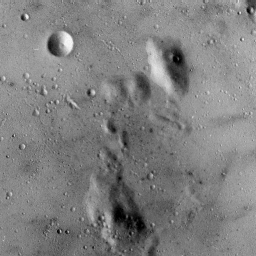

In [3]:
img = testimage("moonsurface")

Our first algorithm is [histogram equalization](https://en.wikipedia.org/wiki/Histogram_equalization), which adjusts the intensities to make their distribution approximately uniform:

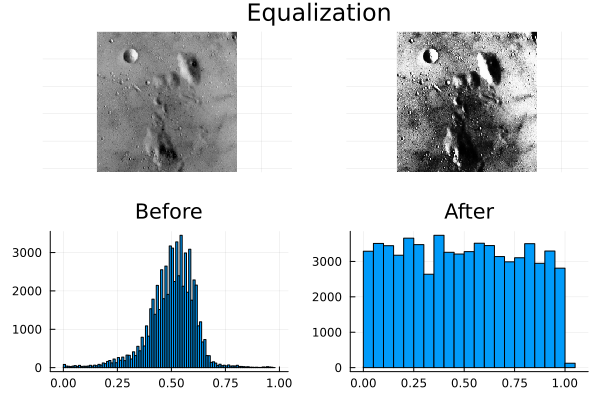

In [4]:
alg = Equalization(nbins = 256)
img_adjusted = adjust_histogram(img, alg);
hist_final = [histogram(vec(Float32.(img))) for img in [img, img_adjusted]]
p1 = plot(img,axis=false)
p2 = plot(img_adjusted,axis=false)
p3 = plot(p1,p2)
p4 = plot(hist_final...,layout = (1,2), size = (512, 256), legend = false, title = ["Before" "After"])
plot(p3,p4;layout=(2,1),plot_title="Equalization")

It should be noted that `Equalization` and other contrast-adjustment algorithms have voluminous mathematical information available with `?Equalization`.

For some images, you may want to perform histogram equalization "locally," stretching the contrast in patches rather than globally throughout the image. This is the job of `AdaptiveEqualization`, which implements an algorithm called Contrast Limited Adaptive Histogram Equalisation (CLAHE).

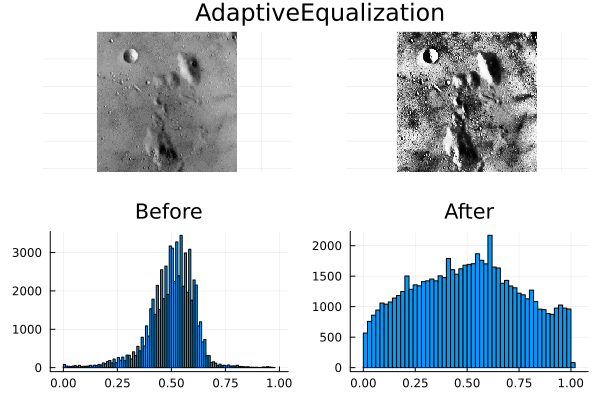

In [5]:
alg = AdaptiveEqualization(nbins = 256, rblocks = 4, cblocks = 4, clip = 0.2)
img_adjusted = adjust_histogram(img, alg);
hist_final = [histogram(vec(Float32.(img))) for img in [img, img_adjusted]]
p1 = plot(img,axis=false)
p2 = plot(img_adjusted,axis=false)
p3 = plot(p1,p2)
p4 = plot(hist_final...,layout = (1,2), size = (512, 256), legend = false, title = ["Before" "After"])
plot(p3,p4;layout=(2,1),plot_title="AdaptiveEqualization")

Compared with `Equalization`, the features in each region of the image are more prominent.

You can also adjust contrast manually. Here with `LinearStretching` we're mapping an input intensity interval `0.3 .. 0.7` to an output interval `0.05 .. 0.95`:

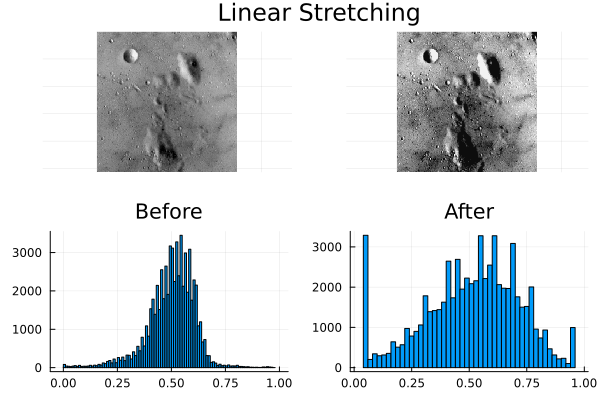

In [6]:
# first generate an algorithm instance
alg = LinearStretching((0.3,0.7) =>(0.05,0.95))
img_adjusted = adjust_histogram(img, alg);
hist_final = [histogram(vec(Float32.(img))) for img in [img, img_adjusted]]
p1 = plot(img,axis=false)
p2 = plot(img_adjusted,axis=false)
p3 = plot(p1,p2)
p4 = plot(hist_final...,layout = (1,2), size = (512, 256), legend = false, title = ["Before" "After"])
plot(p3,p4;layout=(2,1),plot_title="Linear Stretching")

Two modes of nonlinear stretching are `ContrastStretching` and `GammaCorrection`:

- Contrast stretching: $x \rightarrow \frac{x^s}{x^s + t^s}$
- Gamma correction: $x \rightarrow x^\gamma$

Here's a demo of `ContrastStretching`:

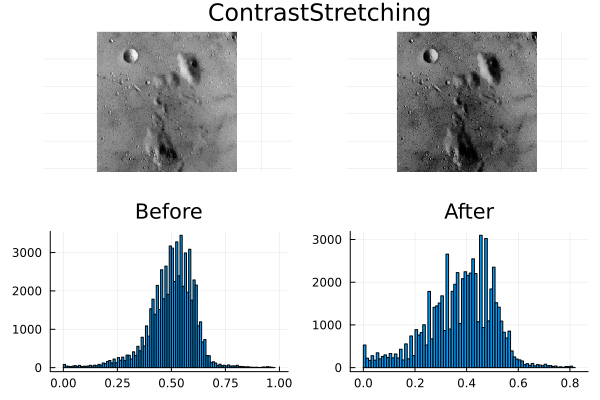

In [7]:
alg = ContrastStretching(t = 0.6, slope = 3)
img_adjusted = adjust_histogram(img, alg);
hist_final = [histogram(vec(Float32.(img))) for img in [img, img_adjusted]]
p1 = plot(img,axis=false)
p2 = plot(img_adjusted,axis=false)
p3 = plot(p1,p2)
p4 = plot(hist_final...,layout = (1,2), size = (512, 256), legend = false, title = ["Before" "After"])
plot(p3,p4;layout=(2,1),plot_title="ContrastStretching")

Finally, sometimes one might want to adjust contrast to approximately match that of a different image. This is the role of `Matching` and `MidwayMatching`:

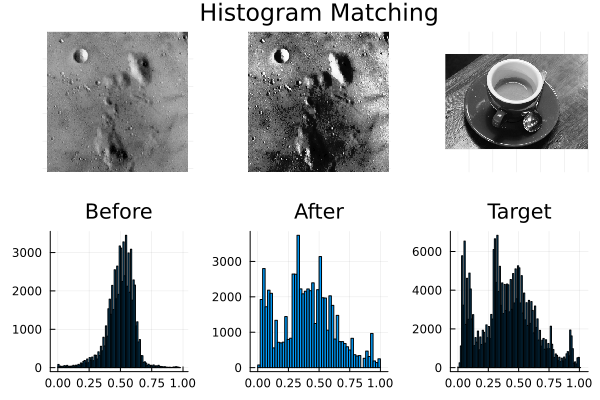

In [8]:
img_target = Gray.(testimage("coffee"))
alg = Matching(targetimg = img_target)

img_adjusted = adjust_histogram(img, alg);
hist_final = [histogram(vec(Float32.(img))) for img in [img, img_adjusted, img_target]]
p1 = plot(img,axis=false)
p2 = plot(img_adjusted,axis=false)
p3 = plot(img_target,axis=false)
p3 = plot(p1,p2,p3,layout=(1,3))
p4 = plot(hist_final...,layout = (1,3), size = (512, 256), legend = false, title = ["Before" "After" "Target"])
plot(p3,p4;layout=(2,1),plot_title="Histogram Matching")

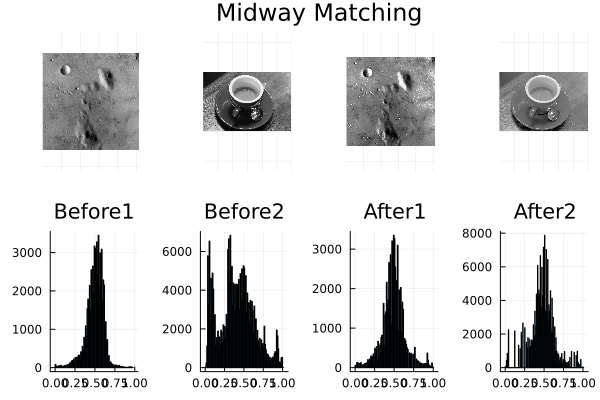

In [9]:
alg = MidwayEqualization(nbins = 256)
img_sequence = adjust_histogram([img, img_target],alg)
img1 = first(img_sequence)
img2 = last(img_sequence)

p1 = plot(img,axis=false)
p2 = plot(img_target,axis=false)
p3 = plot(img1, axis=false)
p4 = plot(img2, axis=false)
p5 = plot(p1,p2,p3,p4, layout=(1,4))
hist_final = [histogram(vec(Float32.(img))) for img in [img, img_target, img1, img2]]
p6 = plot(hist_final...,layout = (1,4), size = (512, 256), legend = false, title = ["Before1" "Before2" "After1" "After2"])
plot(p5,p6;layout=(2,1),plot_title="Midway Matching")

Midway-matching adjust both histograms to match a "midway" intensity distribution (harmonic mean).

# Spatial and Warping Transformations
In this part, we will be discussing support for image cropping, resizing, image rotation, and other spatial transformations of arrays.

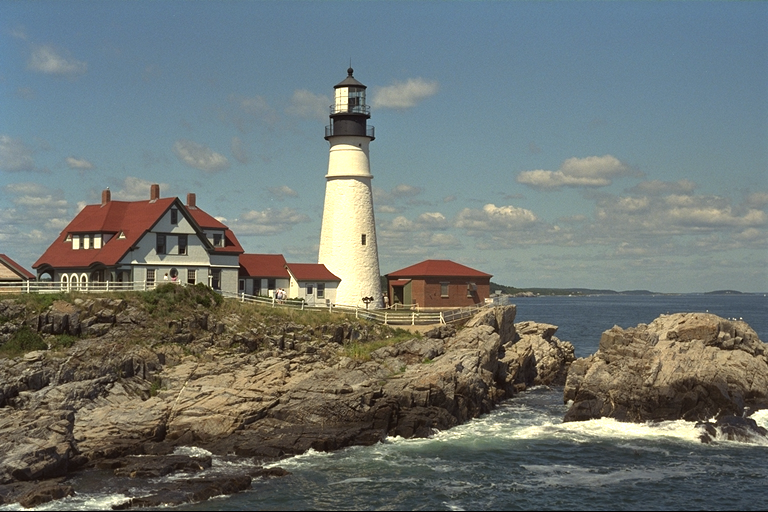

In [10]:
img_source = testimage("lighthouse")

### Cropping
Cropping focuses on a smaller region-of-interest (ROI). It's performed by standard indexing. For example:

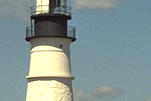

In [11]:
img_cropped = img_source[100:200, 300:450]

Compared to other image-processing environments, Julia offers some interesting new options. What if we wanted to keep track of where our snippet came from? As cropped above, that information is lost:

In [12]:
axes(img_cropped)

(Base.OneTo(101), Base.OneTo(151))

Julia, though, supports arrays with offset axes. A key axiom is this: if `idx` is an index `AbstractVector`, and `i` an integer, then

```
A[idx][i] == A[idx[i]]
```

This implies that `A[idx]` inherits whatever indexing rules `idx` follows. We can exploit that with a type, `Base.IdentityUnitRange`, where the values are equal to their indices:

In [13]:
r = Base.IdentityUnitRange(100:200)

Base.IdentityUnitRange(100:200)

In [14]:
axes(r)

(Base.IdentityUnitRange(100:200),)

This indicates that `r` itself is indexed in the range from `100:200`. We can see that indexing with 1 fails:

In [15]:
r[1]

LoadError: BoundsError: attempt to access 101-element Base.IdentityUnitRange{UnitRange{Int64}} with indices 100:200 at index [1]

but indexing with something in the range `100:200` succeeds:

In [16]:
r[124]

124

Here `r` is acting as the "identity operation" for indexing: it just returns whatever index you supply to it.

Using the axiom above, this implies that indexing with `Base.IdentityUnitRange` axes preserves the coordinates:

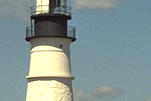

In [17]:
img_cropped_id = img_source[Base.IdentityUnitRange(100:200), Base.IdentityUnitRange(300:450)]

In [18]:
axes(img_cropped_id)

(OffsetArrays.IdOffsetRange(values=100:200, indices=100:200), OffsetArrays.IdOffsetRange(values=300:450, indices=300:450))

We've successfully preserved information about where this snippet came from. This is often extremely useful: you don't have to have special implementations of algorithms that take an optional extra "coordinates of ROI" input, because each array can carry around its own indices.

### Resizing 
Resizing attempts to preserve the content of the image but changing its size. There are various ways to do it which are shown below:

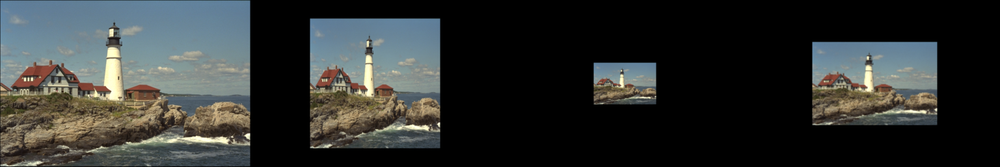

In [19]:
img_square = imresize(img_source, (400, 400));
img_small = imresize(img_source, ratio=1/4);
img_medium = imresize(img_small, size(img_small).*2);
mosaicview(img_source, img_square, img_small, img_medium; nrow=1)

**NOTE**: `imresize` just resamples the original image. If you are shrinking the image, this might be vulnerable to "aliasing." To avoid aliasing when shrinking, blur the image first.

`restrict` is a fast, anti-aliasing method of reducing image size by a factor of 2. You can either pass in specific dimensions or apply restriction to all dimensions:

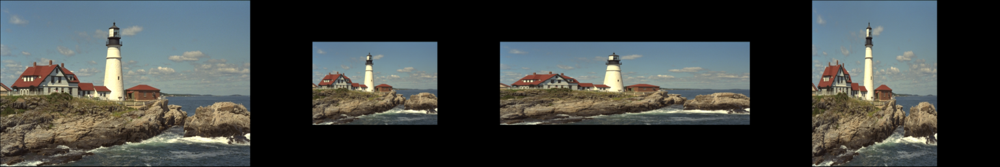

In [20]:
rescaled_both = restrict(img_source); # all dimensions
rescaled_height = restrict(img_source, 1); # dims=1, i.e., height dimension
rescaled_width = restrict(img_source, 2); # dims=2, i.e., width dimension
mosaicview(img_source, rescaled_both, rescaled_height, rescaled_width; nrow=1)

### Rotation
Rotation is often needed for to align objects in a image to horizontal plane or otherwise. Images.jl provides this with `imrotate` function.

Let's rotate image img by θ∈[0,2π) in a clockwise direction around its center point using `imrotate` function that's part of the High Level API of ImageTransformations.jl which is provided through Images.jl

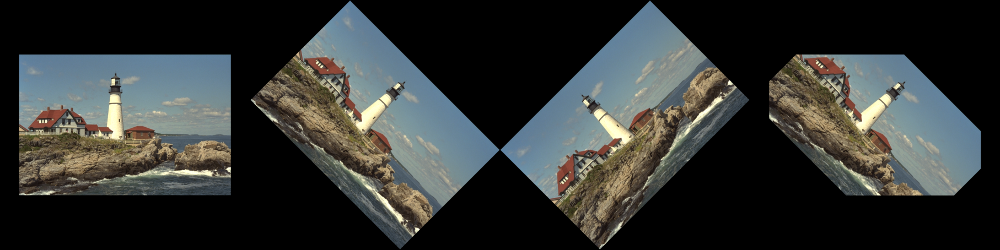

In [21]:
# Rotate the image by π/4 in the clockwise direction
imgc = imrotate(img_source, π/4) # output axes (-105:618, -105:618)

# Rotate the image by π/4 in the counter-clockwise direction
imgcc = imrotate(img_source, -π/4) # output axes (-105:618, -105:618)

# Preserve the original axes
# Note that this is more efficient than `@view imrotate(img, π/4)[axes(img)...]`
imgpr = imrotate(img_source, π/4, axes(img_source)) # output axes (1:512, 1:512)

mosaicview(img_source, imgc, imgcc, imgpr;nrow=1, npad=1)

Finally, you can perform general transformations with `warp`. Let's skew the image:

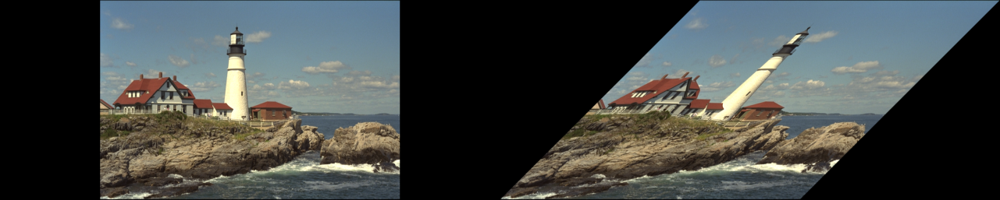

In [22]:
using StaticArrays, CoordinateTransformations
tfm = LinearMap(@SMatrix([1 0; 1 1]))  # create an affine transformation with CoordinateTransformations
imgw = warp(img_source, tfm)
mosaicview(img_source, imgw; nrow=1, npad=1)

# Morphological Operations

Morphological image processing is an area of computer vision which aims to remove imperfections from binary and grayscale images.

Images.jl utilizese ImageMorphology.jl to provide support morphological functions. ImageMorphology.jl holds a collection of non-linear operations related to the shape or morphology of features in an image.

## Introduction

In [23]:
using Images, TestImages

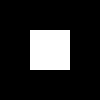

In [24]:
img = zeros(10, 10); img[4:7, 4:7] .= 1.; 
img = Gray.(img)

### Erosion
Erode performs a min-filter over its nearest-neighbors. The default is 8-connectivity in 2d, 27-connectivity in 3d, etc. You can specify the list of dimensions that you want to include in the connectivity, e.g., region = [1,2] would exclude the third dimension from filtering.

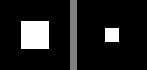

In [25]:
img_erode = erode(img)
mosaic(img, img_erode; nrow = 1, fillvalue=.5, npad=1)

### Dilation
Dilate performs a max-filter over its nearest-neighbors

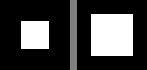

In [26]:
img_dilate = dilate(img)
mosaic(img, img_dilate; nrow = 1, fillvalue=.5, npad=1)

### Opening
Opening morphology operation is equivalent to `dilate(erode(img))`. In `opening(img, [region])`, `region` allows you to control the dimensions over which this operation is performed. Opening can remove small bright spots (i.e. “salt”) and connect small dark cracks.

┌ Info: img:
│   img =
│    5×5 Matrix{Float64}:
│     1.0  0.0  0.0  0.0  0.0
│     0.0  0.0  0.0  0.0  0.0
│     0.0  0.0  1.0  1.0  1.0
│     0.0  0.0  1.0  1.0  1.0
└     0.0  0.0  1.0  1.0  1.0


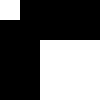

In [27]:
img = zeros(5, 5); img[1, 1] = 1.; img[3:5, 3:5] .= 1.; 
@info "img:" img
Gray.(img)

┌ Info: opening:
│   opening(img) =
│    5×5 Matrix{Float64}:
│     0.0  0.0  0.0  0.0  0.0
│     0.0  0.0  0.0  0.0  0.0
│     0.0  0.0  1.0  1.0  1.0
│     0.0  0.0  1.0  1.0  1.0
└     0.0  0.0  1.0  1.0  1.0


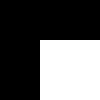

In [28]:
@info "opening:" opening(img)
Gray.(opening(img))

The converse of `opening` is `closing`.

### Tophat
Tophat is defined as the image minus its morphological opening. This operation returns the bright spots of the image that are smaller than the structuring element.

In [29]:
img = zeros(5, 5); img[1, 1] = 1.; img[3:5, 3:5] .= 1.; img

5×5 Matrix{Float64}:
 1.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0
 0.0  0.0  1.0  1.0  1.0
 0.0  0.0  1.0  1.0  1.0
 0.0  0.0  1.0  1.0  1.0

In [30]:
tophat(img)

5×5 Matrix{Float64}:
 1.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0

Its converse is `bothat` (bottom-hat).

### Check out the examples for more: https://juliaimages.org/latest/examples/